In [1]:
# fmt: off
import urllib
from IPython.display import Markdown as md

### change to reflect your notebook
_nb_loc = "06_preprocessing/06g_tiling.ipynb"
_nb_title = "Creating image tiles from a larger image"

_icons=["https://raw.githubusercontent.com/GoogleCloudPlatform/practical-ml-vision-book/master/logo-cloud.png", "https://www.tensorflow.org/images/colab_logo_32px.png", "https://www.tensorflow.org/images/GitHub-Mark-32px.png", "https://www.tensorflow.org/images/download_logo_32px.png"]
_links=["https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?" + urllib.parse.urlencode({"name": _nb_title, "download_url": "https://github.com/takumiohym/practical-ml-vision-book-ja/raw/master/"+_nb_loc}), "https://colab.research.google.com/github/takumiohym/practical-ml-vision-book-ja/blob/master/{0}".format(_nb_loc), "https://github.com/takumiohym/practical-ml-vision-book-ja/blob/master/{0}".format(_nb_loc), "https://raw.githubusercontent.com/takumiohym/practical-ml-vision-book-ja/master/{0}".format(_nb_loc)]
md("""<table class="tfo-notebook-buttons" align="left"><td><a target="_blank" href="{0}"><img src="{4}"/>Run in Vertex AI Workbench</a></td><td><a target="_blank" href="{1}"><img src="{5}" />Run in Google Colab</a></td><td><a target="_blank" href="{2}"><img src="{6}" />View source on GitHub</a></td><td><a href="{3}"><img src="{7}" />Download notebook</a></td></table><br/><br/>""".format(_links[0], _links[1], _links[2], _links[3], _icons[0], _icons[1], _icons[2], _icons[3]))
# fmt: on

<table class="tfo-notebook-buttons" align="left"><td><a target="_blank" href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?name=Creating+image+tiles+from+a+larger+image&download_url=https%3A%2F%2Fgithub.com%2Ftakumiohym%2Fpractical-ml-vision-book-ja%2Fraw%2Fmaster%2F06_preprocessing%2F06g_tiling.ipynb"><img src="https://raw.githubusercontent.com/GoogleCloudPlatform/practical-ml-vision-book/master/logo-cloud.png"/>Run in Vertex AI Workbench</a></td><td><a target="_blank" href="https://colab.research.google.com/github/takumiohym/practical-ml-vision-book-ja/blob/master/06_preprocessing/06g_tiling.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a></td><td><a target="_blank" href="https://github.com/takumiohym/practical-ml-vision-book-ja/blob/master/06_preprocessing/06g_tiling.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a></td><td><a href="https://raw.githubusercontent.com/takumiohym/practical-ml-vision-book-ja/master/06_preprocessing/06g_tiling.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a></td></table><br/><br/>

# 大きな画像から画像タイルを作成する  

このノートブックでは、大きな地理空間画像を並べて表示する入力パイプラインを構築する方法を示します。

## 実行環境
このノートブックは、TPUまたはGPUで実行するように設定されています。

Vertex AI WorkbenchやColabでGPUやTPUを使用する方法については[実行環境のセットアップ
](https://github.com/takumiohym/practical-ml-vision-book-ja/tree/main/environment_setup)を参照してください。

## 入力データ  

In [1]:
!gsutil cat gs://practical-ml-vision-book/images/california_fires.txt

{"fullimg": "gs://practical-ml-vision-book/images/california_fire1.jpg", "fires": [[88, 244], [118, 257], [118, 285], [160, 276], [296, 379]]}
{"fullimg": "gs://practical-ml-vision-book/images/california_fire2.jpg", "fires": [[84, 255], [90, 250], [118, 261], [119, 288], [152, 501], [160, 281], [296, 383]]}


2022-07-11 21:49:16.772639: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-07-11 21:49:16.772689: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-07-11 21:49:18.597024: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-07-11 21:49:18.597079: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-07-11 21:49:18.597110: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (tpu-direct): /proc/driver/nvidia/version does not exist
2022-07-11 21:49:18.597444: I tensorflow/core/platform/cpu_feature

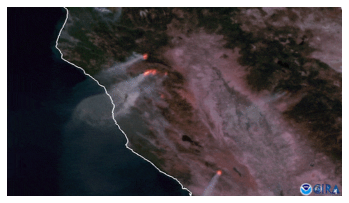

In [2]:
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import json

def read_jpeg(filename):
    img = tf.io.read_file(filename)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img

fullimg = read_jpeg('gs://practical-ml-vision-book/images/california_fire1.jpg')
plt.imshow(fullimg);
plt.axis('off');

## 画像のタイリング

(1, 4, 8, 49152)
(4, 8, 128, 128, 3)


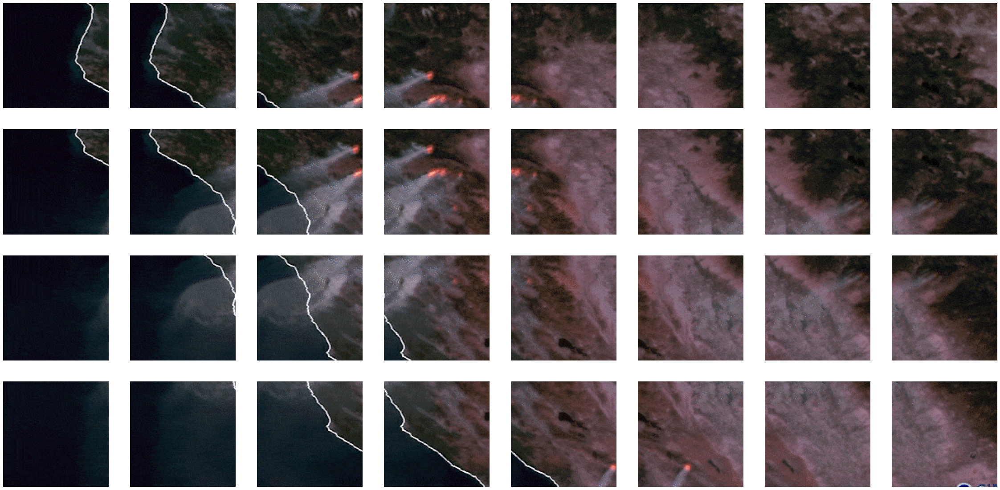

In [3]:
def tile_image(fullimg, CHANNELS=3, TILE_HT=128, TILE_WD=128):
    images = tf.expand_dims(fullimg, axis=0)
    tiles = tf.image.extract_patches(
        images=images,
        sizes=[1, TILE_HT, TILE_WD, 1],
        strides=[1, TILE_HT//2, TILE_WD//2, 1],
        rates=[1, 1, 1, 1],
        padding='VALID')
    print(tiles.shape)

    tiles = tf.squeeze(tiles, axis=0)
    nrows = tiles.shape[0]
    ncols = tiles.shape[1]
    tiles = tf.reshape(tiles, [nrows, ncols, TILE_HT, TILE_WD, CHANNELS])
    print(tiles.shape)
    return tiles

tiles = tile_image(fullimg)
nrows = tiles.shape[0]
ncols = tiles.shape[1]
f, ax = plt.subplots(nrows, ncols, figsize=(40,20))
for rowno in range(nrows):
    for colno in range(ncols):
        img = tiles[rowno][colno]
        ax[rowno, colno].imshow( tiles[rowno][colno].numpy() );
        ax[rowno, colno].axis('off')

## 各タイルのラベルを取得する  

火災の場所を取得し、それらを画像にプロットし、画像を並べて表示してから、各タイル内の最大ピクセルを見つけます。  
最大ピクセルが1.0の場合、タイルには火が含まれているとします。

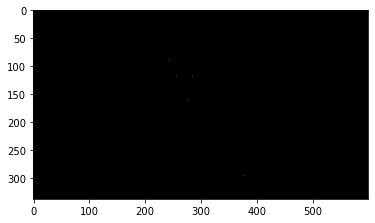

In [4]:
fire_locations = [[88, 244], [118, 257], [118, 285], [160, 276], [296, 379]]
fire_label = np.zeros((338, 600))
for loc in fire_locations:
    fire_label[loc[0]][loc[1]] = 1.0
plt.imshow(fire_label, cmap='gray');

In [5]:
labels = tf.expand_dims(fire_label, axis=-1)
print(labels.shape)
labels = tile_image(labels, 1)
labels = tf.reduce_max(labels, axis=[2, 3, 4])
print(labels)

(338, 600, 1)
(1, 4, 8, 16384)
(4, 8, 128, 128, 1)
tf.Tensor(
[[0. 0. 1. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0. 0.]
 [0. 0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 1. 0. 0.]], shape=(4, 8), dtype=float64)


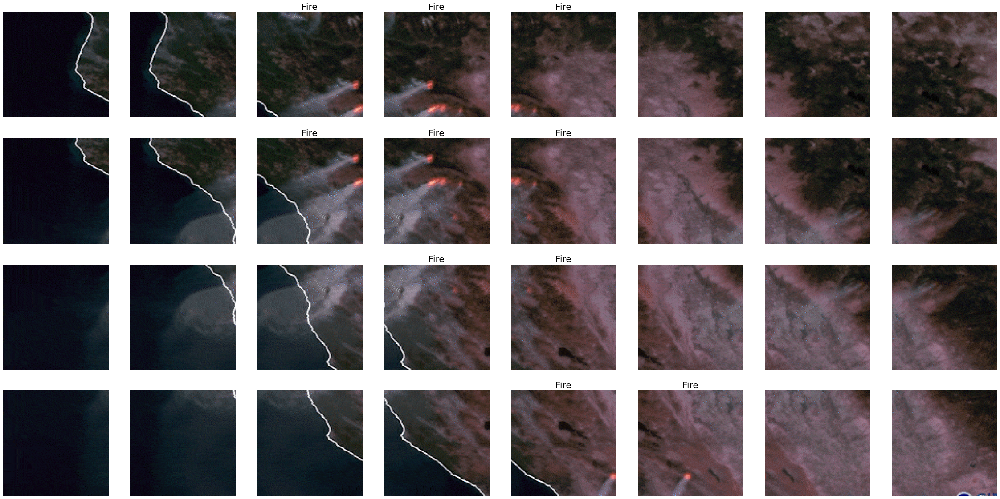

In [6]:
f, ax = plt.subplots(nrows, ncols, figsize=(40,20))
for rowno in range(nrows):
    for colno in range(ncols):
        img = tiles[rowno][colno]
        ax[rowno, colno].imshow( tiles[rowno][colno].numpy() );
        ax[rowno, colno].axis('off')
        if labels[rowno][colno] > 0:
            ax[rowno, colno].set_title('Fire', fontsize=20)

## ファイルからの読み込み

以下で、画像ファイルとfire_locationsで構成されるテキストファイルからパイプラインを作成する方法を示します。

In [7]:
def read_jpeg(filename):
    img = tf.io.read_file(filename)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    print(img.shape)
    return img

def load_from_line(line):
    data = json.loads(line.numpy())
    return (read_jpeg(data['fullimg']),
            tf.convert_to_tensor(data['fires'], dtype=tf.int32))

def create_label_image(fullimg, fire_locations):
    labels = np.zeros_like(fullimg.numpy())
    for loc in fire_locations.numpy():
        labels[loc[0]][loc[1]][0] = 1.0
    return labels

def get_img_fires(line):
    fullimg, fire_locations = tf.py_function(load_from_line, [line], [tf.float32, tf.int32])
    fullimg = tf.reshape(fullimg, [338, 600, 3])
    labels = tf.py_function(create_label_image, [fullimg, fire_locations], [tf.float32])
    labels = tf.reshape(labels, [338, 600, 3])
    return fullimg, fire_locations, labels

(338, 600, 3)
(338, 600, 3)


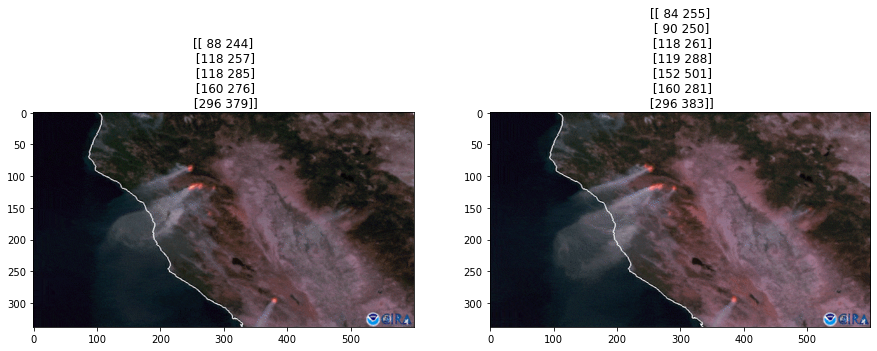

In [8]:
ds = tf.data.TextLineDataset('gs://practical-ml-vision-book/images/california_fires.txt').map(get_img_fires)
f, ax = plt.subplots(1, 2, figsize=(15,10))

for idx, (fullimg, fire_locations, labels) in enumerate(ds):
    ax[idx].imshow( fullimg.numpy() );
    ax[idx].set_title( '{}'.format(fire_locations.numpy()) )

starting tiling
(338, 600, 3)
(338, 600, 3)


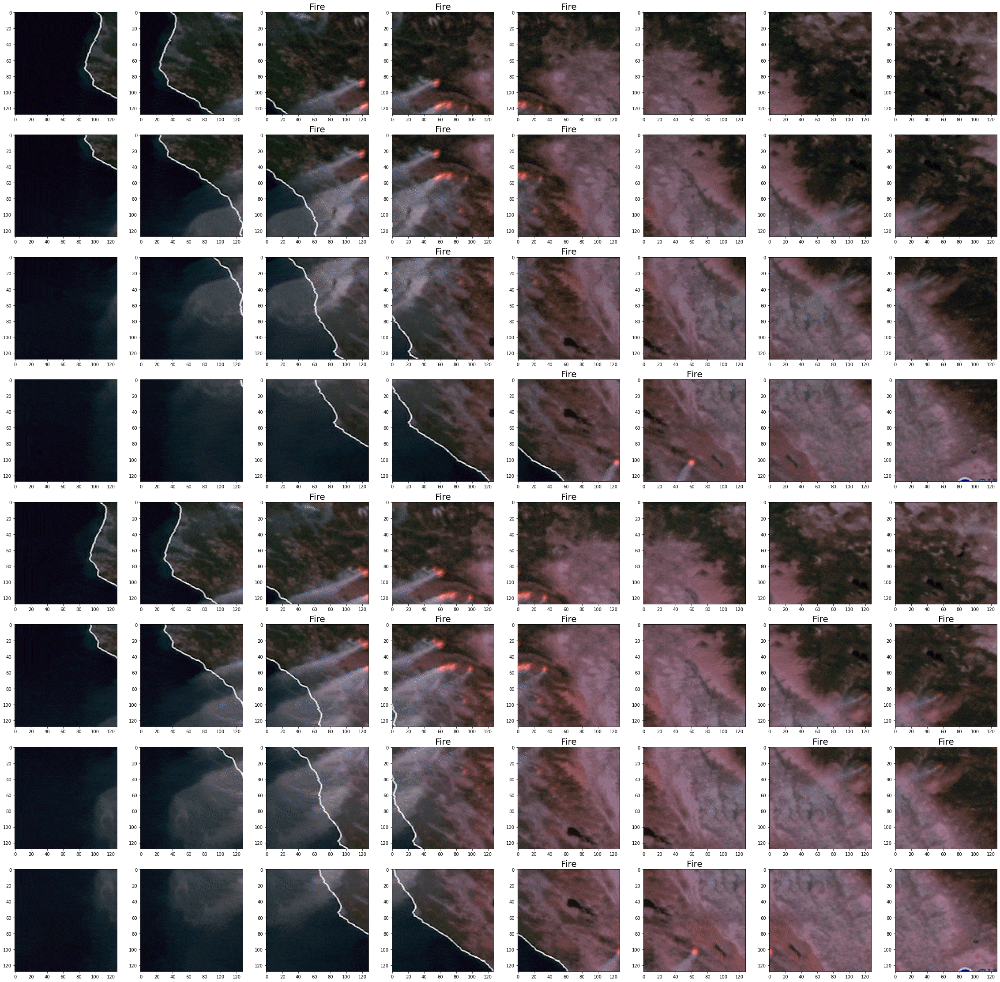

In [9]:
TILE_HT=128
TILE_WD=128
def tile_image(fullimg, CHANNELS=3):
    images = tf.expand_dims(fullimg, axis=0)
    tiles = tf.image.extract_patches(
        images=images,
        sizes=[1, TILE_HT, TILE_WD, 1],
        strides=[1, TILE_HT//2, TILE_WD//2, 1],
        rates=[1, 1, 1, 1],
        padding='VALID')

    tiles = tf.squeeze(tiles, axis=0)
    nrows = tiles.shape[0]
    ncols = tiles.shape[1]
    tiles = tf.reshape(tiles, [-1, TILE_HT, TILE_WD, CHANNELS])
    return tiles

def generate_tiles(fullimg, fire_locations, labels):  
    print("starting tiling")
    tiles = tile_image(fullimg)
    labels = tile_image(labels)
    labels = tf.reduce_max(labels, axis=[1, 2, 3])
    return tiles, labels

ds = tf.data.TextLineDataset(
    'gs://practical-ml-vision-book/images/california_fires.txt'
).map(get_img_fires).map(generate_tiles)
            
f, ax = plt.subplots(8, 8, figsize=(40,40))
idx = 0
for (tiles, labels) in ds:
    for img, label in zip(tiles, labels):
        ax[idx//8, idx%8].imshow(img);
        if label > 0:
            ax[idx//8, idx%8].set_title('Fire', fontsize=20)
        idx += 1

## License
Copyright 2022 Google Inc. Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License. You may obtain a copy of the License at http://www.apache.org/licenses/LICENSE-2.0 Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.